-----------
# 1 START Importing the necessary packages, download models, and configure the paths

In [1]:
# in order not to interfere with the existing files, I will create a new folder for this task called Feiyang_Wang_Semantic_Label_Solution at the root of the drive

import os

colab_root = "/content/Semantic_Label_Solution/"
label_related_data_base_path = colab_root + "labelData/"
grounded_segment_anything_path = colab_root + "Grounded-Segment-Anything/"
usci_lab_3d_data_path = colab_root + "USCilab3D/data/lt_dataset/"
GroundingDINO_path = grounded_segment_anything_path+"GroundingDINO"
segment_anything_path = grounded_segment_anything_path+"segment_anything"
os.makedirs(colab_root, exist_ok=True)
timestamp ='1326036598034801' # example timestamp

In [2]:
# I have modified the code of the Grounded-Segment-Anything library to extract the semantic labels of the images using Grounded SAM.
# Thus the link is not the original library code, but the modified code.
%cd {colab_root}
!git clone https://github.com/akshay18iitg/Grounded_SAM

/content/Semantic_Label_Solution
Cloning into 'Grounded_SAM'...
remote: Enumerating objects: 621, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 621 (delta 24), reused 28 (delta 12), pack-reused 581
Receiving objects: 100% (621/621), 109.75 MiB | 15.94 MiB/s, done.
Resolving deltas: 100% (111/111), done.


In [3]:
import os
os.getcwd()

'/content/Semantic_Label_Solution'

In [4]:
cd ../

/content


In [5]:
!cp -a ./Semantic_Label_Solution/Grounded_SAM/. ./Ground_SAM/

In [6]:
!rm -rf Semantic_Label_Solution/

In [7]:
import os

# /content/Ground_SAM/Grounded-Segment-Anything-main

colab_root = "/content/Ground_SAM/"
label_related_data_base_path = colab_root + "labelData/"
grounded_segment_anything_path = colab_root + "Grounded-Segment-Anything-main/"
usci_lab_3d_data_path = colab_root + "USCilab3D/data/lt_dataset/"
GroundingDINO_path = grounded_segment_anything_path+"GroundingDINO"
segment_anything_path = grounded_segment_anything_path+"segment_anything"
os.makedirs(colab_root, exist_ok=True)
timestamp ='1326036598034801' # example timestamp

In [8]:
%cd {colab_root}

/content/Ground_SAM


In [9]:
# !rm -rf USCilab3D task1-point-clouds-labelling.zip Grounded-Segment-Anything labelData

# In order to facilitate the file upload process and the code running process, I upload the data to the github repository and download it here.
!wget https://github.com/fy916/USCiLab-supporting-code/raw/main/task1-point-clouds-labelling.zip
!unzip task1-point-clouds-labelling.zip

%cd {grounded_segment_anything_path}
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!wget https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth
!wget https://huggingface.co/spaces/xinyu1205/Tag2Text/resolve/main/ram_swin_large_14m.pth
!wget https://huggingface.co/spaces/xinyu1205/Tag2Text/resolve/main/tag2text_swin_14m.pth

--2024-02-18 02:18:13--  https://github.com/fy916/USCiLab-supporting-code/raw/main/task1-point-clouds-labelling.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/fy916/USCiLab-supporting-code/main/task1-point-clouds-labelling.zip [following]
--2024-02-18 02:18:14--  https://raw.githubusercontent.com/fy916/USCiLab-supporting-code/main/task1-point-clouds-labelling.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6858047 (6.5M) [application/zip]
Saving to: ‘task1-point-clouds-labelling.zip’

task1-point-clouds- 100%[===================>]   6.54M  --.-KB/s    in 0.02s   

2024-02-18 02:18:1

In [10]:
print(grounded_segment_anything_path)

/content/Ground_SAM/Grounded-Segment-Anything-main/


In [11]:
# install the required packages for the Grounded-Segment-Anything library
%cd {colab_root}

import os
# folder_path = 'Grounded-Segment-Anything'
init_file_path = os.path.join(grounded_segment_anything_path, '__init__.py')

# Create the __init__.py file
with open(init_file_path, 'w') as f:
    pass

%cd {grounded_segment_anything_path}
!pip install -q -r requirements.txt
%cd {GroundingDINO_path}
!pip install -q .
%cd {segment_anything_path}
!pip install -q .
%cd {grounded_segment_anything_path}
!git submodule init
!git submodule update


import os, sys

if not os.path.exists('Extracted'):
    os.makedirs('Extracted')

if not os.path.exists('Test Folder'):
    os.makedirs('Test Folder')

if not os.path.exists('Final Result'):
    os.makedirs('Final Result')

# sys.path.append(os.path.join(os.getcwd(), "GroundingDINO"))
sys.path.append(GroundingDINO_path)


%cd {usci_lab_3d_data_path}
!ls

!pip install open3d
!pip install numpy
!pip install transformers

/content/Ground_SAM
/content/Ground_SAM/Grounded-Segment-Anything-main
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 81.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 107.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 86.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.3/266.3 kB 33.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.1/92.1 kB 13.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 34

#### END Importing the necessary packages, download models, and configure the paths
-----------
# 2 START Projecting the point cloud to the image and save the 3D points and 2D pixels mapping

In [12]:
%cd {usci_lab_3d_data_path}

#You may have do some modifications here
import os
import sys
import re

def find_closest_file(input_filename):
    match = re.search(r'(\d+)', input_filename)
    if not match:
        raise ValueError("Input filename does not contain a numeric part.")

    numeric_part = int(match.group(1))

    lb3_folders = ['./lb3/Cam0', './lb3/Cam1', './lb3/Cam2', './lb3/Cam4', './lb3/Cam5']

    closest_filename = None
    closest_difference = float('inf')

    files_in_folder = os.listdir(lb3_folders[0])


    for file_in_folder in files_in_folder:
        match_folder = re.search(r'(\d+)', file_in_folder)
        if not match_folder:
            continue

        numeric_folder = int(match_folder.group(1))
        difference = abs(numeric_folder - numeric_part)

        if difference < closest_difference:
            closest_difference = difference
            closest_filename = os.path.join(lb3_folders[0], file_in_folder)

    if closest_filename is None:
        raise FileNotFoundError("No matching file found in the lb3 folders.")

    return [os.path.join(folder, closest_filename.split('/')[-1]) for folder in lb3_folders]

# Example usage
input_filename = './velodyne_sync/'+'1326036598034801'+'.bin'
result = find_closest_file(input_filename)
print(result)


/content/Ground_SAM/USCilab3D/data/lt_dataset
['./lb3/Cam0/1326036598034801.jpg', './lb3/Cam1/1326036598034801.jpg', './lb3/Cam2/1326036598034801.jpg', './lb3/Cam4/1326036598034801.jpg', './lb3/Cam5/1326036598034801.jpg']


In [13]:
# !/usr/bin/python
# You may have do some modifications here
#
# Demonstrates how to project velodyne points to camera imagery. Requires a binary
# velodyne sync file, undistorted image, and assumes that the calibration files are
# in the directory.
#
# To use:
#
#    python project_vel_to_cam.py vel img cam_num
#
#       vel:  The velodyne binary file (timestamp.bin)
#       img:  The undistorted image (timestamp.tiff)
#   cam_num:  The index (0 through 5) of the camera
#

import sys
import struct
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
import open3d as o3d

#from undistort import *

def convert(x_s, y_s, z_s):

    scaling = 0.005 # 5 mm
    offset = -100.0

    x = x_s * scaling + offset
    y = y_s * scaling + offset
    z = z_s * scaling + offset

    return x, y, z

def load_vel_hits(filename):

    f_bin = open(filename, "rb")

    hits = []

    while True:

        x_str = f_bin.read(2)
        if x_str == b'': # eof
            break
        x = struct.unpack('<H', x_str)[0]
        y = struct.unpack('<H', f_bin.read(2))[0]
        z = struct.unpack('<H', f_bin.read(2))[0]
        i = struct.unpack('B', f_bin.read(1))[0]
        l = struct.unpack('B', f_bin.read(1))[0]

        x, y, z = convert(x, y, z)

        # Load in homogenous
        hits += [[x, y, z, 1]]

    f_bin.close()
    hits = np.asarray(hits)

    return hits.transpose()

def ssc_to_homo(ssc):

    # Convert 6-DOF ssc coordinate transformation to 4x4 homogeneous matrix
    # transformation

    sr = np.sin(np.pi/180.0 * ssc[3])
    cr = np.cos(np.pi/180.0 * ssc[3])

    sp = np.sin(np.pi/180.0 * ssc[4])
    cp = np.cos(np.pi/180.0 * ssc[4])

    sh = np.sin(np.pi/180.0 * ssc[5])
    ch = np.cos(np.pi/180.0 * ssc[5])

    H = np.zeros((4, 4))

    H[0, 0] = ch*cp
    H[0, 1] = -sh*cr + ch*sp*sr
    H[0, 2] = sh*sr + ch*sp*cr
    H[1, 0] = sh*cp
    H[1, 1] = ch*cr + sh*sp*sr
    H[1, 2] = -ch*sr + sh*sp*cr
    H[2, 0] = -sp
    H[2, 1] = cp*sr
    H[2, 2] = cp*cr

    H[0, 3] = ssc[0]
    H[1, 3] = ssc[1]
    H[2, 3] = ssc[2]

    H[3, 3] = 1

    return H

def project_vel_to_cam(hits, cam_num):

    # Load camera parameters

    K = np.loadtxt('K_cam%d.csv' % (cam_num), delimiter=',')
    x_lb3_c = np.loadtxt('x_lb3_c%d.csv' % (cam_num), delimiter=',')

    # Other coordinate transforms we need
    x_body_lb3 = [0.035, 0.002, -1.23, -179.93, -0.23, 0.50]

    # Now do the projection
    T_lb3_c = ssc_to_homo(x_lb3_c)
    T_body_lb3 = ssc_to_homo(x_body_lb3)

    T_lb3_body = np.linalg.inv(T_body_lb3)
    T_c_lb3 = np.linalg.inv(T_lb3_c)

    T_c_body = np.matmul(T_c_lb3, T_lb3_body)

    hits_c = np.matmul(T_c_body, hits)
    hits_im = np.matmul(K, hits_c[0:3, :])

    return hits_im

In [14]:
# I have modified the project function to save the cloud points to files
# also save the projected image to files

def project(vel, img, cam_num, point_pixel_mapping, timestamp):
    # Load velodyne points

    hits_body = load_vel_hits(vel)
    transposed_hits_body = hits_body.T

    image = Image.open(img)

    cam_num = int(cam_num)

    hits_image = project_vel_to_cam(hits_body, cam_num)

    x_im = hits_image[0, :] / hits_image[2, :]
    y_im = hits_image[1, :] / hits_image[2, :]
    z_im = hits_image[2, :]

    idx_infront = z_im > 0
    x_im = x_im[idx_infront]
    y_im = y_im[idx_infront]
    z_im = z_im[idx_infront]

    plt.figure(1)
    plt.scatter(x_im, y_im, c=z_im, s=5, linewidths=0)
    plt.xlim(0, 1616)
    plt.ylim(0, 1232)
    plt.imshow(image)


    record = np.zeros((len(idx_infront), 3))
    record.fill(-1)  # Fill the array with -1

    counter_idx = 0
    for i in range(len(idx_infront)):
        if idx_infront[i]:
            corresponding_2D_point = np.array([x_im[counter_idx], y_im[counter_idx], z_im[counter_idx]]).astype(int)
            record[i] = corresponding_2D_point
            counter_idx += 1

    print("cam_num is: ", cam_num)

    if cam_num == 0:
        for i in range(len(transposed_hits_body)):
            point_pixel_mapping.append([transposed_hits_body[i]])
        os.makedirs("./output/"+ timestamp, exist_ok=True)

        xyz = transposed_hits_body[:, :3]

        # Create a point cloud
        point_cloud = o3d.geometry.PointCloud()

        # Set the points in the point cloud
        point_cloud.points = o3d.utility.Vector3dVector(xyz)

        cloud_relative_path = os.path.join("output", timestamp, "cloud.pcd")

        o3d.io.write_point_cloud(cloud_relative_path, point_cloud)
        full_path = os.path.abspath(cloud_relative_path)
        print("Point cloud saved to", full_path)


    print("transposed_hits_body length", len(transposed_hits_body))
    print("point_pixel_mapping_length", len(point_pixel_mapping))
    # print(len(record))

    for i in range(len(transposed_hits_body)):
        point_pixel_mapping[i].append(list(record[i]))

    os.makedirs(label_related_data_base_path, exist_ok=True)
    save_dir = "mapping_" + timestamp + "_cam_" + str(cam_num) + ".png"
    save_dir = os.path.join(label_related_data_base_path, save_dir)
    # Save the plotted image with points
    plt.savefig(save_dir)
    full_path = os.path.abspath(save_dir)
    print("Mapped 2D point of Cam", cam_num, "saved to", full_path)

    plt.show()

    return point_pixel_mapping

cam_num is:  0
Point cloud saved to /content/Ground_SAM/USCilab3D/data/lt_dataset/output/1326036598034801/cloud.pcd
transposed_hits_body length 59815
point_pixel_mapping_length 59815
Mapped 2D point of Cam 0 saved to /content/Ground_SAM/labelData/mapping_1326036598034801_cam_0.png


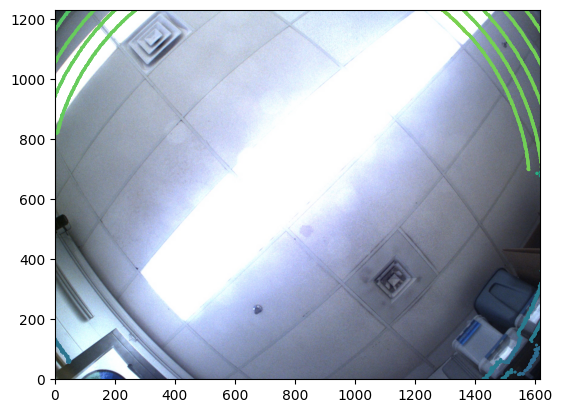

cam_num is:  1
transposed_hits_body length 59815
point_pixel_mapping_length 59815
Mapped 2D point of Cam 1 saved to /content/Ground_SAM/labelData/mapping_1326036598034801_cam_1.png


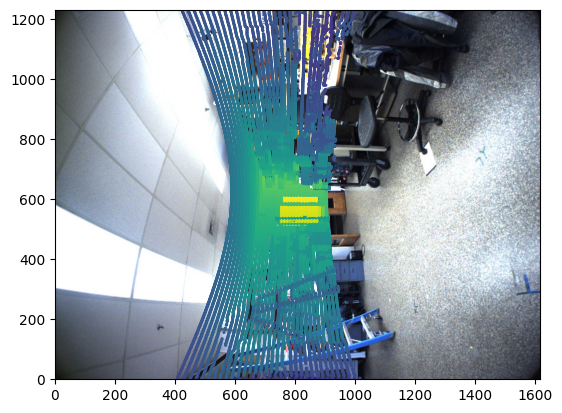

cam_num is:  2
transposed_hits_body length 59815
point_pixel_mapping_length 59815
Mapped 2D point of Cam 2 saved to /content/Ground_SAM/labelData/mapping_1326036598034801_cam_2.png


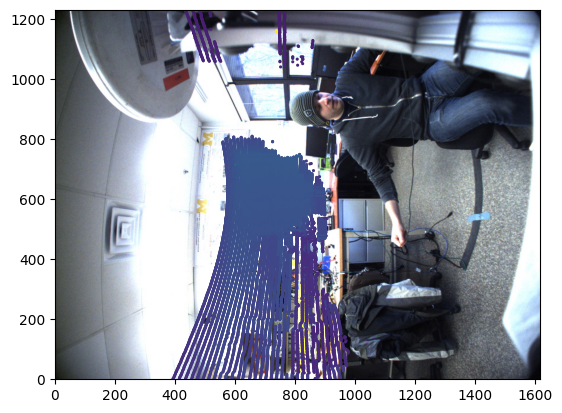

cam_num is:  3
transposed_hits_body length 59815
point_pixel_mapping_length 59815
Mapped 2D point of Cam 3 saved to /content/Ground_SAM/labelData/mapping_1326036598034801_cam_3.png


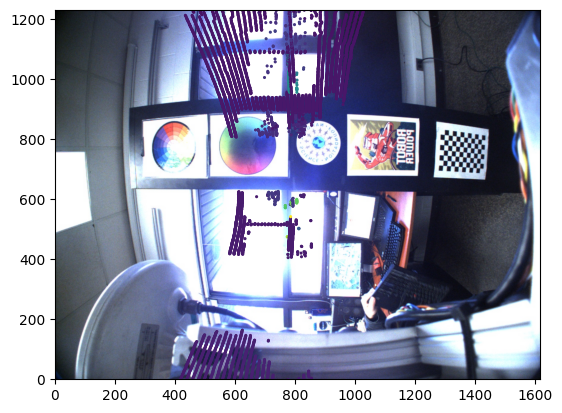

cam_num is:  4
transposed_hits_body length 59815
point_pixel_mapping_length 59815
Mapped 2D point of Cam 4 saved to /content/Ground_SAM/labelData/mapping_1326036598034801_cam_4.png


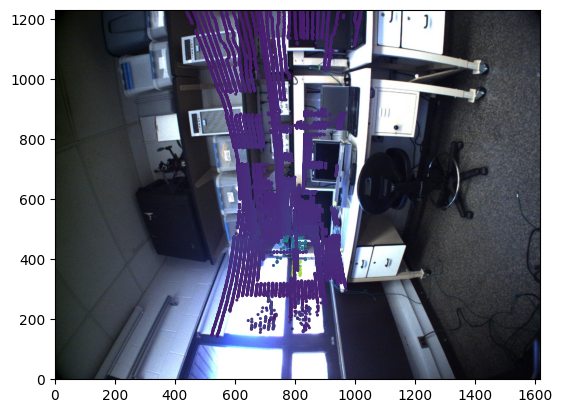

cam_num is:  5
transposed_hits_body length 59815
point_pixel_mapping_length 59815
Mapped 2D point of Cam 5 saved to /content/Ground_SAM/labelData/mapping_1326036598034801_cam_5.png


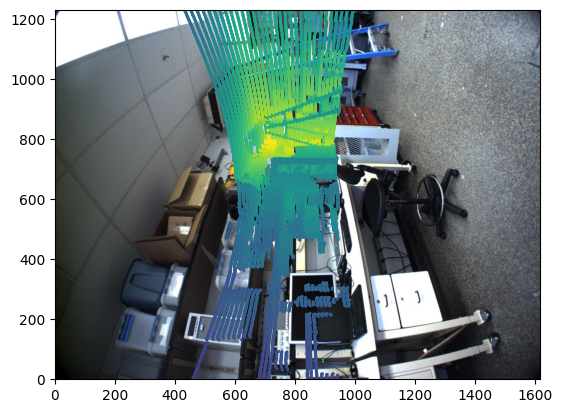

In [15]:
vel = os.path.join(usci_lab_3d_data_path, "velodyne_sync", timestamp+".bin")

all_img_paths = []
for i in range(0,6):
    all_img_paths.append(os.path.join(usci_lab_3d_data_path, "lb3", "Cam" + str(i), timestamp + ".jpg"))


point_pixel_mapping = []
for i, image_path in enumerate(all_img_paths):
    project(vel, image_path, i, point_pixel_mapping, timestamp)

all_points_info = point_pixel_mapping

In [16]:
# get some example points
all_points_info[:10]

[[array([-2.095, -2.505, -2.965,  1.   ]),
  [271.0, 1233.0, 1.0],
  [381.0, 1324.0, 1.0],
  [570.0, 528.0, 3.0],
  [-1974.0, -4623.0, 0.0],
  [-1.0, -1.0, -1.0],
  [-1.0, -1.0, -1.0]],
 [array([-2.37, -2.84, -1.64,  1.  ]),
  [-2231.0, 4166.0, 0.0],
  [723.0, 1317.0, 1.0],
  [747.0, 527.0, 3.0],
  [213.0, -4721.0, 0.0],
  [-1.0, -1.0, -1.0],
  [-1.0, -1.0, -1.0]],
 [array([-2.215, -2.65 , -2.97 ,  1.   ]),
  [242.0, 1268.0, 1.0],
  [405.0, 1322.0, 1.0],
  [582.0, 528.0, 3.0],
  [-1833.0, -4628.0, 0.0],
  [-1.0, -1.0, -1.0],
  [-1.0, -1.0, -1.0]],
 [array([-2.37, -2.83, -1.55,  1.  ]),
  [-3380.0, 5494.0, 0.0],
  [743.0, 1319.0, 1.0],
  [757.0, 528.0, 3.0],
  [352.0, -4606.0, 0.0],
  [-1.0, -1.0, -1.0],
  [-1.0, -1.0, -1.0]],
 [array([-2.345, -2.8  , -2.97 ,  1.   ]),
  [209.0, 1305.0, 1.0],
  [427.0, 1322.0, 1.0],
  [593.0, 528.0, 3.0],
  [-1654.0, -4551.0, 0.0],
  [-1.0, -1.0, -1.0],
  [-1.0, -1.0, -1.0]],
 [array([-2.375, -2.84 , -1.46 ,  1.   ]),
  [-5949.0, 8503.0, 0.0],
  [762.0,

In [17]:
import pickle

points_data_path = os.path.join(label_related_data_base_path, "points_data.pkl")

with open(points_data_path, 'wb') as f:
    pickle.dump(all_points_info, f)
    full_path = os.path.abspath(points_data_path)
    print("Point Data Saved to", full_path)

Point Data Saved to /content/Ground_SAM/labelData/points_data.pkl


```all_points_info
[0]: original 3D point list
[1]: 2D point list for camera 0
[2]: 2D point list for camera 1
[3]: 2D point list for camera 2
[4]: 2D point list for camera 3
[5]: 2D point list for camera 4
[6]: 2D point list for camera 5
[7]: all possible category (label) of the point in the mask (concluded from all six cameras)
```

#### END Projecting the point cloud to the image and save the 3D points and 2D pixels mapping
-----------
# 3 START Grounded SAM Extract Semantic Labels of the Images !!!!!!

#### I have made the following modifications to the Grounded-Segment-Anything library code of automatic_label_tag2text_demo.py
#### The code can save the semantic labels and the mask of the results in the labelData folder, which can be read by the next step.

![sc](https://github.com/fy916/USCiLab-supporting-code/blob/main/screenshots/6.png?raw=true)

![sc](https://github.com/fy916/USCiLab-supporting-code/blob/main/screenshots/7.png?raw=true)

In [18]:
# import the necessary packages for the Grounded-Segment-Anything library

%cd {grounded_segment_anything_path}

import argparse
import copy

from IPython.display import display
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import box_convert

# Grounding DINO
import GroundingDINO.groundingdino.datasets.transforms as T
from GroundingDINO.groundingdino.models import build_model
from GroundingDINO.groundingdino.util import box_ops
from GroundingDINO.groundingdino.util.slconfig import SLConfig
from GroundingDINO.groundingdino.util.utils import clean_state_dict, get_phrases_from_posmap
from GroundingDINO.groundingdino.util.inference import annotate, load_image, predict

import supervision as sv

# segment anything
from segment_anything import build_sam, SamPredictor
import cv2
import numpy as np
import matplotlib.pyplot as plt


# diffusers
import PIL
import requests
import torch
from io import BytesIO
from diffusers import StableDiffusionInpaintPipeline


from huggingface_hub import hf_hub_download


/content/Ground_SAM/Grounded-Segment-Anything-main


In [19]:
all_img_paths

['/content/Ground_SAM/USCilab3D/data/lt_dataset/lb3/Cam0/1326036598034801.jpg',
 '/content/Ground_SAM/USCilab3D/data/lt_dataset/lb3/Cam1/1326036598034801.jpg',
 '/content/Ground_SAM/USCilab3D/data/lt_dataset/lb3/Cam2/1326036598034801.jpg',
 '/content/Ground_SAM/USCilab3D/data/lt_dataset/lb3/Cam3/1326036598034801.jpg',
 '/content/Ground_SAM/USCilab3D/data/lt_dataset/lb3/Cam4/1326036598034801.jpg',
 '/content/Ground_SAM/USCilab3D/data/lt_dataset/lb3/Cam5/1326036598034801.jpg']

In [20]:
# execute the Grounded-Segment-Anything library code to extract the semantic labels of the images using Grounded SAM

!export CUDA_VISIBLE_DEVICES=0

%cd {grounded_segment_anything_path}
for camid, input_image_path in enumerate(all_img_paths):
  !python automatic_label_ensemble_demo.py \
    --config GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py \
    --tag2text_checkpoint tag2text_swin_14m.pth \
    --grounded_checkpoint groundingdino_swint_ogc.pth \
    --sam_checkpoint sam_vit_h_4b8939.pth \
    --input_image {input_image_path} \
    --output_dir {label_related_data_base_path} \
    --box_threshold 0.25 \
    --text_threshold 0.2 \
    --iou_threshold 0.5 \
    --device "cuda" \
    --cam {camid}

/content/Ground_SAM/Grounded-Segment-Anything-main
2024-02-18 02:22:00.913724: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-18 02:22:00.913772: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-18 02:22:00.914932: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-18 02:22:01.997271: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
final text_encoder_type: bert-base-uncased
tokenizer_config.json: 100% 28.0/28.0 [00:00<00:00, 151kB/s]
config.json: 100% 570/570 [00:00<00:00, 3.31MB/s]
vocab.txt: 100% 232k/232k [00:00<00:

#### END Grounded SAM Extract Semantic Labels of the Images
-----------
# 4 START Syncing the semantic labels to the 3D points !!!!

#### Note: After this section the labels for the 3D points will be generated, here are some previews of the important variables here

## all_label_data is used to store the mask (True or False) that indicates whether a pixel in a 2D image belons to the given category (label) or not

![sc](https://github.com/fy916/USCiLab-supporting-code/blob/main/screenshots/3.jpg?raw=true)

## all_label_mapping_list is used to store the corresponding mapping of the label ID and the identified labels (text labels)

![sc](https://github.com/fy916/USCiLab-supporting-code/blob/main/screenshots/4.jpg?raw=true)

## all_point_data is used to store the info of the 3D point and its mapped 2D points in each image of different Cam ID, and will finally store the all possible labels for this 3D point inferred from the point's mapped 2D points.   

![sc](https://github.com/fy916/USCiLab-supporting-code/blob/main/screenshots/5.png?raw=true)

Labels for Cam 0
{"caption": "a picture of a bathroom with a toilet, sink, mirror, mirror on the wall and light coming in from the window", "mask": [{"value": 0, "label": "background"}, {"value": 1, "label": "window", "logit": 0.4, "box": [4.6748809814453125, 0.5014419555664062, 377.0562744140625, 170.558349609375]}, {"value": 2, "label": "room bathroom", "logit": 0.34, "box": [5.09307861328125, 3.07989501953125, 1608.20751953125, 1228.26904296875]}, {"value": 3, "label": "toilet toilet toilet", "logit": 0.3, "box": [1394.440185546875, 152.6990509033203, 1607.4383544921875, 370.71270751953125]}, {"value": 4, "label": "bathroom sink", "logit": 0.3, "box": [1318.52978515625, 2.8516693115234375, 1611.40185546875, 370.5616455078125]}, {"value": 5, "label": "wall", "logit": 0.29, "box": [2.0069580078125, 1.243194580078125, 462.385498046875, 547.438232421875]}, {"value": 6, "label": "mirror mirror", "logit": 0.28, "box": [86.46076965332031, 0.20487594604492188, 241.2182159423828, 35.95835113

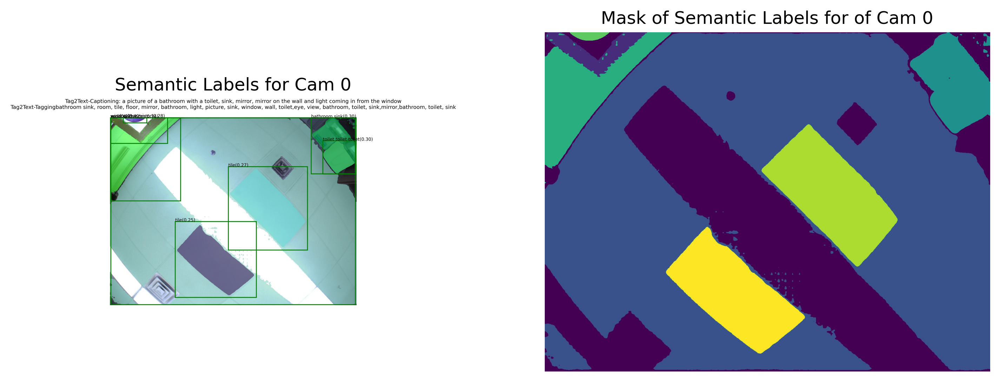

Labels for Cam 1
{"caption": "a room with a table, shelves and tools on the floor", "mask": [{"value": 0, "label": "background"}, {"value": 1, "label": "wall", "logit": 0.41, "box": [2.181549072265625, 3.42730712890625, 602.74951171875, 1228.228759765625]}, {"value": 2, "label": "shelf rack", "logit": 0.32, "box": [572.4544677734375, 12.357521057128906, 1134.10595703125, 241.09228515625]}, {"value": 3, "label": "building room", "logit": 0.32, "box": [5.20440673828125, 2.2332763671875, 1609.88330078125, 1229.3690185546875]}, {"value": 4, "label": "wall", "logit": 0.31, "box": [966.88671875, 3.121826171875, 1612.435546875, 1228.256103515625]}, {"value": 5, "label": "shelf shelf", "logit": 0.3, "box": [663.62255859375, 424.35064697265625, 1019.44140625, 489.112548828125]}, {"value": 6, "label": "shelf shelf", "logit": 0.29, "box": [688.4743041992188, 541.7633056640625, 974.1072998046875, 627.9697875976562]}]}


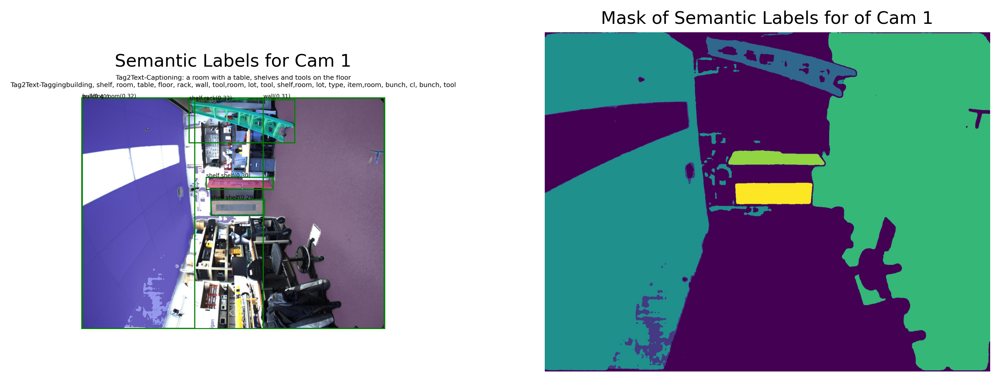

Labels for Cam 2
{"caption": "a person in a bathroom with a toilet in the middle of the room", "mask": [{"value": 0, "label": "background"}, {"value": 1, "label": "room", "logit": 0.47, "box": [6.21337890625, 3.8836669921875, 1607.2265625, 1226.18359375]}, {"value": 2, "label": "person man man man", "logit": 0.41, "box": [780.528564453125, 434.8263244628906, 1591.7783203125, 1107.444091796875]}, {"value": 3, "label": "wall", "logit": 0.39, "box": [2.2862091064453125, 2.53570556640625, 489.2490234375, 1226.900390625]}, {"value": 4, "label": "laptop laptop", "logit": 0.31, "box": [942.3947143554688, 483.85211181640625, 1103.984375, 608.7706909179688]}, {"value": 5, "label": "toilet toilet", "logit": 0.29, "box": [45.77264404296875, 849.334716796875, 486.8839111328125, 1228.954833984375]}]}


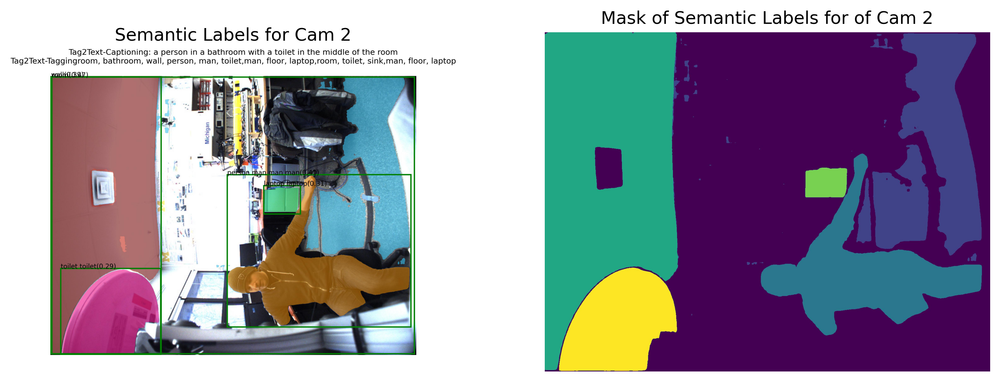

Labels for Cam 3
{"caption": "a picture of a person at a desk with a keyboard in front of a window with stickers on the top of it", "mask": [{"value": 0, "label": "background"}, {"value": 1, "label": "keyboard", "logit": 0.48, "box": [1052.225830078125, 219.15206909179688, 1322.900146484375, 386.3730773925781]}, {"value": 2, "label": "picture", "logit": 0.4, "box": [971.7129516601562, 672.7089233398438, 1217.1116943359375, 881.4724731445312]}, {"value": 3, "label": "room room", "logit": 0.4, "box": [5.53759765625, 4.0052490234375, 1608.9676513671875, 1228.623291015625]}, {"value": 4, "label": "sticker", "logit": 0.36, "box": [801.62841796875, 707.2691040039062, 954.332275390625, 863.1412353515625]}, {"value": 5, "label": "laptop", "logit": 0.35, "box": [944.5927124023438, 455.6895751953125, 1086.81640625, 625.263916015625]}, {"value": 6, "label": "camera phone", "logit": 0.31, "box": [835.5576782226562, 152.34991455078125, 929.8783569335938, 242.84068298339844]}, {"value": 7, "label": 

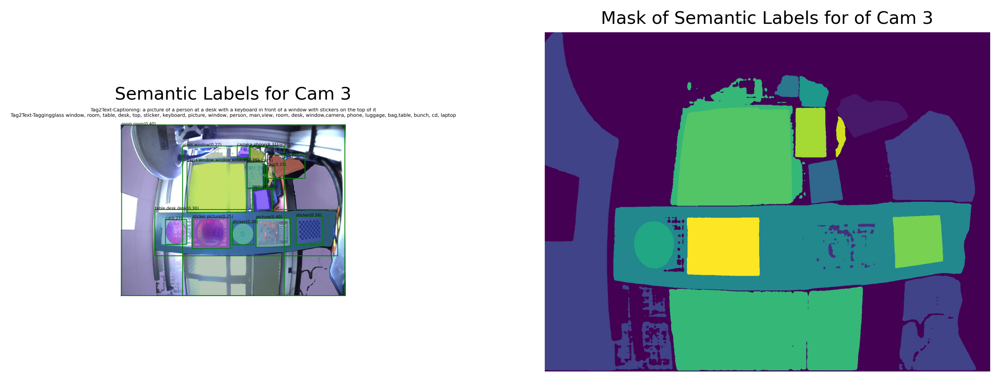

Labels for Cam 4
{"caption": "a room with a lit ceiling and stacks of electronics on shelves and boxes", "mask": [{"value": 0, "label": "background"}, {"value": 1, "label": "cabinet", "logit": 0.38, "box": [1064.533447265625, 1077.29296875, 1304.9764404296875, 1229.3448486328125]}, {"value": 2, "label": "room", "logit": 0.36, "box": [6.65679931640625, 3.59368896484375, 1607.6787109375, 1228.626220703125]}, {"value": 3, "label": "computer laptop", "logit": 0.28, "box": [782.9725952148438, 450.23565673828125, 939.04150390625, 644.8973388671875]}, {"value": 4, "label": "appliance", "logit": 0.26, "box": [413.429443359375, 1029.293212890625, 675.046630859375, 1228.9530029296875]}, {"value": 5, "label": "appliance", "logit": 0.26, "box": [440.896728515625, 802.7955322265625, 635.6390380859375, 913.2565307617188]}, {"value": 6, "label": "shelf", "logit": 0.25, "box": [1053.8541259765625, 1008.2817993164062, 1437.16162109375, 1112.9775390625]}]}


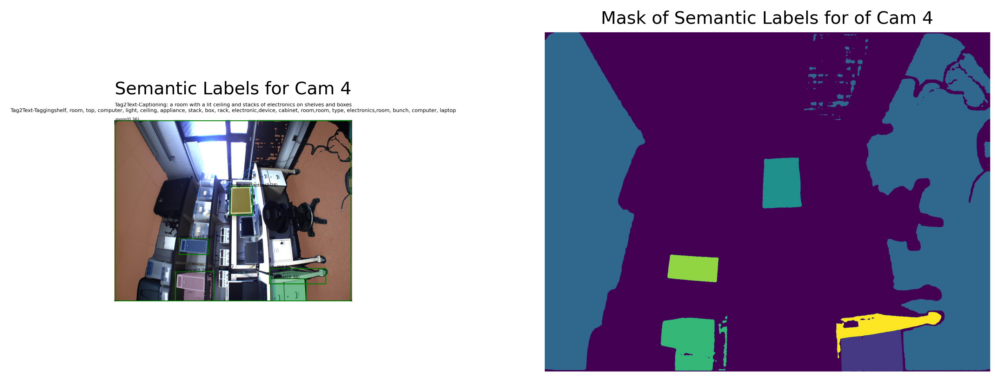

Labels for Cam 5
{"caption": "an overhead view of a room with shelves, appliances, wires, and shelves on the floor and ceiling of a building", "mask": [{"value": 0, "label": "background"}, {"value": 1, "label": "wall", "logit": 0.41, "box": [2.934112548828125, 7.86163330078125, 579.91650390625, 1227.57373046875]}, {"value": 2, "label": "television computer", "logit": 0.38, "box": [768.5325317382812, 113.12380981445312, 954.0442504882812, 364.1048278808594]}, {"value": 3, "label": "floor", "logit": 0.35, "box": [1000.4149169921875, 4.2081298828125, 1612.486572265625, 1228.0753173828125]}, {"value": 4, "label": "machine appliance", "logit": 0.31, "box": [621.4027099609375, 674.8319702148438, 1152.25146484375, 852.0299682617188]}, {"value": 5, "label": "box", "logit": 0.3, "box": [259.489990234375, 375.9329833984375, 547.7654418945312, 711.2916259765625]}, {"value": 6, "label": "building room", "logit": 0.3, "box": [5.47113037109375, 3.3072509765625, 1609.1220703125, 1228.16552734375]}, {

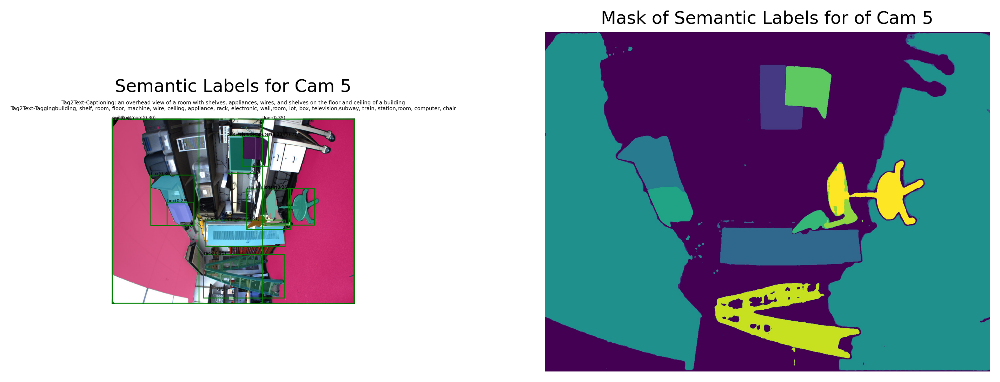

In [21]:
# take a look at the result generated by the semantic generator

import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json

for i in range(6):
    curr_cam_label_img_path = os.path.join(label_related_data_base_path, "labelled_img_cam"+str(i)+".jpg")
    curr_mask_img_path = os.path.join(label_related_data_base_path, "mask_img_cam"+str(i)+".jpg")
    curr_json_file_path = os.path.join(label_related_data_base_path, "label"+str(i)+".json")

    print("Labels for Cam", i)
    if os.path.isfile(curr_json_file_path):
      with open(curr_json_file_path, 'r') as f:
          json_data = f.read()
    else:
      print(f"Object doesn't exist")
      continue

    # Parse the JSON string
    parsed_json = json.loads(json_data)

    # Print the formatted JSON
    print(json.dumps(parsed_json))


    # Load the images
    img1 = mpimg.imread(curr_cam_label_img_path)
    img2 = mpimg.imread(curr_mask_img_path)

    # set dpi of plot
    plt.rcParams['figure.dpi'] = 300
    # Create a figure and axes
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # Adjust figsize as needed

    # Display the images
    axes[0].imshow(img1)
    axes[0].set_title('Semantic Labels for Cam '+str(i))
    axes[0].axis('off')

    axes[1].imshow(img2)
    axes[1].set_title('Mask of Semantic Labels for of Cam '+str(i))
    axes[1].axis('off')

    plt.show()

In [22]:
# load data from checkpoints

all_point_data = None
all_label_data = []

import pickle, os
point_pkl_path = os.path.join(label_related_data_base_path, "points_data.pkl")
with open(point_pkl_path, 'rb') as f:
    all_point_data = pickle.load(f)
    full_path = os.path.abspath(point_pkl_path)
    print("Points Info Checkpoint Loaded from", point_pkl_path)

for idx_point in range(len(all_point_data)):
    all_point_data[idx_point].append([])

for i in range(6):
    curr_label_data_path = os.path.join(label_related_data_base_path, "mask"+str(i)+".pkl")
    curr_label_data = None
    with open(curr_label_data_path, 'rb') as f:
        curr_label_data = pickle.load(f)
        full_path = os.path.abspath(curr_label_data_path)
        print("Label Info of Cam " + str(i) + " Loaded from", curr_label_data_path)
    all_label_data.append(curr_label_data)


Points Info Checkpoint Loaded from /content/Ground_SAM/labelData/points_data.pkl
Label Info of Cam 0 Loaded from /content/Ground_SAM/labelData/mask0.pkl
Label Info of Cam 1 Loaded from /content/Ground_SAM/labelData/mask1.pkl
Label Info of Cam 2 Loaded from /content/Ground_SAM/labelData/mask2.pkl
Label Info of Cam 3 Loaded from /content/Ground_SAM/labelData/mask3.pkl
Label Info of Cam 4 Loaded from /content/Ground_SAM/labelData/mask4.pkl
Label Info of Cam 5 Loaded from /content/Ground_SAM/labelData/mask5.pkl


In [23]:
# take a look at the json labels

all_label_mapping_list = []
def extract_label_mapping(label_json_path):
    import json
    with open(label_json_path, 'r') as f:
        label_json = json.load(f)
        print("Label Info Loaded from", label_json_path)
    curr_cam_label_maps = {}
    # go through every key in label_json["mask"]
    for idx in range(len(label_json["mask"])):
        print(label_json["mask"][idx]["value"], label_json["mask"][idx]["label"])
        curr_label_data = {label_json["mask"][idx]["value"]: label_json["mask"][idx]["label"]}
        # add curr_label_map to curr_cam_label_maps
        curr_cam_label_maps = {**curr_cam_label_maps, **curr_label_data}
    return curr_cam_label_maps


for i in range(6):
    curr_cam_label_mapping = extract_label_mapping(os.path.join(label_related_data_base_path, "label"+str(i)+".json"))
    all_label_mapping_list.append(curr_cam_label_mapping)

all_label_mapping_list

Label Info Loaded from /content/Ground_SAM/labelData/label0.json
0 background
1 window
2 room bathroom
3 toilet toilet toilet
4 bathroom sink
5 wall
6 mirror mirror
7 tile
8 tile
Label Info Loaded from /content/Ground_SAM/labelData/label1.json
0 background
1 wall
2 shelf rack
3 building room
4 wall
5 shelf shelf
6 shelf shelf
Label Info Loaded from /content/Ground_SAM/labelData/label2.json
0 background
1 room
2 person man man man
3 wall
4 laptop laptop
5 toilet toilet
Label Info Loaded from /content/Ground_SAM/labelData/label3.json
0 background
1 keyboard
2 picture
3 room room
4 sticker
5 laptop
6 camera phone
7 table desk desk
8 camera phone
9 cd
10 glass window
11 glass window window window
12 sticker
13 picture
14 bag
15 sticker picture
Label Info Loaded from /content/Ground_SAM/labelData/label4.json
0 background
1 cabinet
2 room
3 computer laptop
4 appliance
5 appliance
6 shelf
Label Info Loaded from /content/Ground_SAM/labelData/label5.json
0 background
1 wall
2 television compute

[{0: 'background',
  1: 'window',
  2: 'room bathroom',
  3: 'toilet toilet toilet',
  4: 'bathroom sink',
  5: 'wall',
  6: 'mirror mirror',
  7: 'tile',
  8: 'tile'},
 {0: 'background',
  1: 'wall',
  2: 'shelf rack',
  3: 'building room',
  4: 'wall',
  5: 'shelf shelf',
  6: 'shelf shelf'},
 {0: 'background',
  1: 'room',
  2: 'person man man man',
  3: 'wall',
  4: 'laptop laptop',
  5: 'toilet toilet'},
 {0: 'background',
  1: 'keyboard',
  2: 'picture',
  3: 'room room',
  4: 'sticker',
  5: 'laptop',
  6: 'camera phone',
  7: 'table desk desk',
  8: 'camera phone',
  9: 'cd',
  10: 'glass window',
  11: 'glass window window window',
  12: 'sticker',
  13: 'picture',
  14: 'bag',
  15: 'sticker picture'},
 {0: 'background',
  1: 'cabinet',
  2: 'room',
  3: 'computer laptop',
  4: 'appliance',
  5: 'appliance',
  6: 'shelf'},
 {0: 'background',
  1: 'wall',
  2: 'television computer',
  3: 'floor',
  4: 'machine appliance',
  5: 'box',
  6: 'building room',
  7: 'box',
  8: 'cha

In [24]:
# go through each 3D points, check if its corresponding 2D pixels in any mapped image has a label which is identified
# then add the label to mark as the 3D point label

category_mask_example = all_label_data[0][0]
max_height, max_width, _ = category_mask_example.shape


# go through each 3D point
for idx_point in range(len(all_point_data)):
    # go through each images taken by different cameras
    for cam_id in range(0,6):

        # get the corresponding 2d mapping of the 3D point
        curr_point_2d_point_at_cam = all_point_data[idx_point][cam_id+1]

        # check if the mapped 2D point is valid in the image pixel
        if curr_point_2d_point_at_cam[0] >= 0 and curr_point_2d_point_at_cam[0] < max_height:
            if curr_point_2d_point_at_cam[1] >= 0 and curr_point_2d_point_at_cam[1] < max_width:
                if curr_point_2d_point_at_cam[2] >= 0:

                    # get the point and point is valid in cam
                    # get the cam label
                    curr_cam_label = all_label_data[cam_id] # label is True False...
                    curr_cam_label_maps = all_label_mapping_list[cam_id] # maps is  1: 'room', 2: 'computer', 3: 'appliance'

                    for label_id, each_identified_label in enumerate(curr_cam_label): # label id is 0, 1, 2, 3...
                        curr_point_belong_to_label = each_identified_label[int(curr_point_2d_point_at_cam[0])][int(curr_point_2d_point_at_cam[1])][0]
                        # check if the pixel is in the labelled area
                        if curr_point_belong_to_label:
                            # add the label to the 3D point label list
                            curr_label_mapping = curr_cam_label_maps[label_id+1]
                            all_point_data[idx_point][7].append(curr_label_mapping)

In [25]:
# print some examples

labels = ["Original 3D Point", "Cam 0 2D Point", "Cam 1 2D Point", "Cam 2 2D Point", "Cam 3 2D Point", "Cam 4 2D Point", "Cam 5 2D Point", "All Identified Category (Label) in the mask"]

import numpy as np
# set random seed
np.random.seed(80)
random_idx = sorted([int(np.random.randint(0, len(all_point_data))) for _ in range(10)])

for idx_example_point in random_idx:
    print(f"example point id {idx_example_point}")
    curr_point = all_point_data[idx_example_point]
    formatted_entries = [f"{label}: {entry}" for label, entry in zip(labels, curr_point)]
    print('\n'.join(formatted_entries))
    print("\n")


example point id 8599
Original 3D Point: [-1.58   0.995 -2.135  1.   ]
Cam 0 2D Point: [6.0, 119.0, 0.0]
Cam 1 2D Point: [-1.0, -1.0, -1.0]
Cam 2 2D Point: [237.0, 1713.0, 0.0]
Cam 3 2D Point: [612.0, 591.0, 1.0]
Cam 4 2D Point: [-33.0, -1150.0, 0.0]
Cam 5 2D Point: [-1.0, -1.0, -1.0]
All Identified Category (Label) in the mask: ['mirror mirror', 'glass window', 'glass window window window']


example point id 8714
Original 3D Point: [-1.57   1.115 -2.115  1.   ]
Cam 0 2D Point: [-7.0, 46.0, 0.0]
Cam 1 2D Point: [-1.0, -1.0, -1.0]
Cam 2 2D Point: [175.0, 1926.0, 0.0]
Cam 3 2D Point: [623.0, 614.0, 1.0]
Cam 4 2D Point: [166.0, -789.0, 0.0]
Cam 5 2D Point: [-1.0, -1.0, -1.0]
All Identified Category (Label) in the mask: ['glass window', 'glass window window window']


example point id 15154
Original 3D Point: [ 0.52   2.605 -1.53   1.   ]
Cam 0 2D Point: [1639.0, -3778.0, 0.0]
Cam 1 2D Point: [-1.0, -1.0, -1.0]
Cam 2 2D Point: [-1.0, -1.0, -1.0]
Cam 3 2D Point: [698.0, 1536.0, 1.0]
Cam 4 

In [26]:
# in order to make full use of 6 cameras, get the final label for the 3D point by calculating the most common label for this 3D point in all mapped 2D pixels in different images
for idx_point in range(len(all_point_data)):
    all_point_data[idx_point].append([])

from collections import Counter

def most_common_string(lst):
    # Count occurrences of each string in the list
    counts = Counter(lst)
    # Get the most common string and its count
    most_common = counts.most_common(1)
    # Return the most common string
    return most_common[0][0] if most_common else None


for point_idx in range(len(all_point_data)):
    labels = all_point_data[point_idx][7]
    if labels:
        all_point_data[point_idx][8] = most_common_string(labels)

In [27]:
# format the data

formatted_point_data_list = []
for row_idx in range(len(all_point_data)):
    formatted_point_data_list.append([])

for row_idx, row in enumerate(all_point_data):
    for column_idx, column in enumerate(row):
        if column_idx < 7:
            formatted_column = [f"{value:.2f}" for value in column]
            formatted_point_data_list[row_idx].append(', '.join(map(str, formatted_column)))
        else:
            formatted_column = column
            formatted_point_data_list[row_idx].append(formatted_column)


import pandas as pd
df = pd.DataFrame(formatted_point_data_list)
df

,0,1,2,3,4,5,6,7,8
0,"-2.09, -2.50, -2.97, 1.00","271.00, 1233.00, 1.00","381.00, 1324.00, 1.00","570.00, 528.00, 3.00","-1974.00, -4623.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[room bathroom, building room, wall]",room bathroom
1,"-2.37, -2.84, -1.64, 1.00","-2231.00, 4166.00, 0.00","723.00, 1317.00, 1.00","747.00, 527.00, 3.00","213.00, -4721.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
2,"-2.22, -2.65, -2.97, 1.00","242.00, 1268.00, 1.00","405.00, 1322.00, 1.00","582.00, 528.00, 3.00","-1833.00, -4628.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[room bathroom, building room, wall]",room bathroom
3,"-2.37, -2.83, -1.55, 1.00","-3380.00, 5494.00, 0.00","743.00, 1319.00, 1.00","757.00, 528.00, 3.00","352.00, -4606.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
4,"-2.34, -2.80, -2.97, 1.00","209.00, 1305.00, 1.00","427.00, 1322.00, 1.00","593.00, 528.00, 3.00","-1654.00, -4551.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[room bathroom, building room, wall]",room bathroom
...,...,...,...,...,...,...,...,...,...
59810,"-2.41, -2.77, -1.90, 1.00","-913.00, 2545.00, 0.00","660.00, 1349.00, 1.00","717.00, 536.00, 3.00","31.00, -3623.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
59811,"-1.94, -2.23, -0.61, 1.00","-1.00, -1.00, -1.00","987.00, 1355.00, 1.00","881.00, 536.00, 2.00","1695.00, -3665.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
59812,"-2.42, -2.78, -1.81, 1.00","-1216.00, 2885.00, 0.00","680.00, 1350.00, 1.00","727.00, 536.00, 3.00","136.00, -3606.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
59813,"-1.46, -1.68, -0.66, 1.00","-1.00, -1.00, -1.00","1027.00, 1366.00, 1.00","901.00, 537.00, 2.00","1916.00, -3777.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room


In [28]:
# add headers to the 3D point data
labels = ["Original 3D Point", "Cam 0 2D Point", "Cam 1 2D Point", "Cam 2 2D Point", "Cam 3 2D Point", "Cam 4 2D Point", "Cam 5 2D Point", "All Identified Category (Label) in the mask", "Most Common Label Across All Cams"]
df.columns = labels
df

,Original 3D Point,Cam 0 2D Point,Cam 1 2D Point,Cam 2 2D Point,Cam 3 2D Point,Cam 4 2D Point,Cam 5 2D Point,All Identified Category (Label) in the mask,Most Common Label Across All Cams
0,"-2.09, -2.50, -2.97, 1.00","271.00, 1233.00, 1.00","381.00, 1324.00, 1.00","570.00, 528.00, 3.00","-1974.00, -4623.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[room bathroom, building room, wall]",room bathroom
1,"-2.37, -2.84, -1.64, 1.00","-2231.00, 4166.00, 0.00","723.00, 1317.00, 1.00","747.00, 527.00, 3.00","213.00, -4721.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
2,"-2.22, -2.65, -2.97, 1.00","242.00, 1268.00, 1.00","405.00, 1322.00, 1.00","582.00, 528.00, 3.00","-1833.00, -4628.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[room bathroom, building room, wall]",room bathroom
3,"-2.37, -2.83, -1.55, 1.00","-3380.00, 5494.00, 0.00","743.00, 1319.00, 1.00","757.00, 528.00, 3.00","352.00, -4606.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
4,"-2.34, -2.80, -2.97, 1.00","209.00, 1305.00, 1.00","427.00, 1322.00, 1.00","593.00, 528.00, 3.00","-1654.00, -4551.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[room bathroom, building room, wall]",room bathroom
...,...,...,...,...,...,...,...,...,...
59810,"-2.41, -2.77, -1.90, 1.00","-913.00, 2545.00, 0.00","660.00, 1349.00, 1.00","717.00, 536.00, 3.00","31.00, -3623.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
59811,"-1.94, -2.23, -0.61, 1.00","-1.00, -1.00, -1.00","987.00, 1355.00, 1.00","881.00, 536.00, 2.00","1695.00, -3665.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
59812,"-2.42, -2.78, -1.81, 1.00","-1216.00, 2885.00, 0.00","680.00, 1350.00, 1.00","727.00, 536.00, 3.00","136.00, -3606.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room
59813,"-1.46, -1.68, -0.66, 1.00","-1.00, -1.00, -1.00","1027.00, 1366.00, 1.00","901.00, 537.00, 2.00","1916.00, -3777.00, 0.00","-1.00, -1.00, -1.00","-1.00, -1.00, -1.00","[building room, wall]",building room


In [29]:
# write the labels to the csv file, which is in the same directory as the cloud.pcd
%cd {usci_lab_3d_data_path}
df_save_path = os.path.join("output", timestamp, "label.csv")
df.to_csv(df_save_path, header = True)
full_path = os.path.abspath(df_save_path)
print("Point Data and Label saved to", full_path)

/content/Ground_SAM/USCilab3D/data/lt_dataset
Point Data and Label saved to /content/Ground_SAM/USCilab3D/data/lt_dataset/output/1326036598034801/label.csv
